## Importing Necessary Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium.plugins import HeatMap
from sklearn.preprocessing import LabelEncoder
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from scipy.stats import chi2_contingency



In [2]:
path = "BPD_Part_1_Victim_Based_Crime_Data.csv"
df = pd.read_csv(path)

## Understanding Data

In [3]:
df.head()

,CrimeDate,CrimeTime,CrimeCode,Location,Description,Inside/Outside,Weapon,Post,District,Neighborhood,Longitude,Latitude,Location 1,Premise,Total Incidents
0,09/02/2017,23:30:00,3JK,4200 AUDREY AVE,ROBBERY - RESIDENCE,I,KNIFE,913.0,SOUTHERN,Brooklyn,-76.60541,39.22951,"(39.2295100000, -76.6054100000)",ROW/TOWNHO,1
1,09/02/2017,23:00:00,7A,800 NEWINGTON AVE,AUTO THEFT,O,NaN,133.0,CENTRAL,Reservoir Hill,-76.63217,39.31360,"(39.3136000000, -76.6321700000)",STREET,1
2,09/02/2017,22:53:00,9S,600 RADNOR AV,SHOOTING,Outside,FIREARM,524.0,NORTHERN,Winston-Govans,-76.60697,39.34768,"(39.3476800000, -76.6069700000)",Street,1
3,09/02/2017,22:50:00,4C,1800 RAMSAY ST,AGG. ASSAULT,I,OTHER,934.0,SOUTHERN,Carrollton Ridge,-76.64526,39.28315,"(39.2831500000, -76.6452600000)",ROW/TOWNHO,1
4,09/02/2017,22:31:00,4E,100 LIGHT ST,COMMON ASSAULT,O,HANDS,113.0,CENTRAL,Downtown West,-76.61365,39.28756,"(39.2875600000, -76.6136500000)",STREET,1


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 276529 entries, 0 to 276528
Data columns (total 15 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   CrimeDate        276529 non-null  object 
 1   CrimeTime        276529 non-null  object 
 2   CrimeCode        276529 non-null  object 
 3   Location         274322 non-null  object 
 4   Description      276529 non-null  object 
 5   Inside/Outside   266250 non-null  object 
 6   Weapon           95577 non-null   object 
 7   Post             276305 non-null  float64
 8   District         276449 non-null  object 
 9   Neighborhood     273789 non-null  object 
 10  Longitude        274325 non-null  float64
 11  Latitude         274325 non-null  float64
 12  Location 1       274325 non-null  object 
 13  Premise          265772 non-null  object 
 14  Total Incidents  276529 non-null  int64  
dtypes: float64(3), int64(1), object(11)
memory usage: 31.6+ MB


In [5]:
df.describe()

,Post,Longitude,Latitude,Total Incidents
count,276305.000000,274325.000000,274325.000000,276529.0
mean,506.256821,-76.617444,39.307399,1.0
std,260.735370,0.042306,0.029556,0.0
min,2.000000,-76.711620,39.200410,1.0
25%,243.000000,-76.648460,39.288330,1.0
50%,511.000000,-76.613960,39.303640,1.0
75%,731.000000,-76.587440,39.327810,1.0
max,945.000000,-76.528500,39.372930,1.0


In [6]:
print(df.isnull().sum())

CrimeDate               0
CrimeTime               0
CrimeCode               0
Location             2207
Description             0
Inside/Outside      10279
Weapon             180952
Post                  224
District               80
Neighborhood         2740
Longitude            2204
Latitude             2204
Location 1           2204
Premise             10757
Total Incidents         0
dtype: int64


## Dealing with Missing Values

In [7]:
df['Location'] = df['Location'].fillna('Unknown') 
df['Inside/Outside'] = df['Inside/Outside'].fillna(df['Inside/Outside'].mode()[0])
df['Weapon'] = df['Weapon'].fillna('NO WEAPON')
df = df.dropna(subset=['Post'])
df['District'] = df['District'].fillna(df['District'].mode()[0])
df['Neighborhood'] = df['Neighborhood'].fillna('Unknown')
df = df.dropna(subset=['Longitude', 'Latitude'])
df = df.dropna(subset=['Location 1'])
df['Premise'] = df['Premise'].fillna(df['Premise'].mode()[0])

In [8]:
print(df.isnull().sum())

CrimeDate          0
CrimeTime          0
CrimeCode          0
Location           0
Description        0
Inside/Outside     0
Weapon             0
Post               0
District           0
Neighborhood       0
Longitude          0
Latitude           0
Location 1         0
Premise            0
Total Incidents    0
dtype: int64


In [9]:
df.shape

(274318, 15)

## Data Preprocessing

In [10]:
df['CrimeTime'] = df['CrimeTime'].replace('24:00:00', '00:00:00')
df['Date'] = df['CrimeDate'] + ' ' + df['CrimeTime']
df['Date'] = pd.to_datetime(df['Date'])

In [11]:
df['Day'] = df['Date'].dt.day
df['Month'] = df['Date'].dt.month
df['Year'] = df['Date'].dt.year
df['Weekday'] = df['Date'].dt.weekday + 1
df['Hour'] = df['Date'].dt.hour

In [28]:

df['Inside/Outside'] = df['Inside/Outside'].replace('I', 'Inside')
df['Inside/Outside'] = df['Inside/Outside'].replace('O', 'Outside')
df["Inside/Outside"].unique() #Replacing dummy values with original one

array(['Inside', 'Outside'], dtype=object)

In [13]:
df = df.drop(['CrimeDate', 'CrimeTime'], axis = 1)
df = df.drop("Total Incidents",axis = 1)

In [14]:
df = df.set_index('Date')

## EDA

In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 274318 entries, 2017-09-02 23:30:00 to 2012-01-01 00:00:00
Data columns (total 17 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   CrimeCode       274318 non-null  object 
 1   Location        274318 non-null  object 
 2   Description     274318 non-null  object 
 3   Inside/Outside  274318 non-null  object 
 4   Weapon          274318 non-null  object 
 5   Post            274318 non-null  float64
 6   District        274318 non-null  object 
 7   Neighborhood    274318 non-null  object 
 8   Longitude       274318 non-null  float64
 9   Latitude        274318 non-null  float64
 10  Location 1      274318 non-null  object 
 11  Premise         274318 non-null  object 
 12  Day             274318 non-null  int32  
 13  Month           274318 non-null  int32  
 14  Year            274318 non-null  int32  
 15  Weekday         274318 non-null  int32  
 16  Hour            274318

In [16]:
df.describe()

,Post,Longitude,Latitude,Day,Month,Year,Weekday,Hour
count,274318.000000,274318.000000,274318.000000,274318.000000,274318.000000,274318.000000,274318.000000,274318.000000
mean,506.235909,-76.617444,39.307398,15.810603,6.448232,2014.362178,3.965033,13.290426
std,260.802755,0.042305,0.029556,8.799539,3.310283,1.659773,1.986615,6.771574
min,111.000000,-76.711620,39.200410,1.000000,1.000000,2012.000000,1.000000,0.000000
25%,243.000000,-76.648460,39.288330,8.000000,4.000000,2013.000000,2.000000,9.000000
50%,511.000000,-76.613960,39.303640,16.000000,6.000000,2014.000000,4.000000,15.000000
75%,731.000000,-76.587440,39.327810,23.000000,9.000000,2016.000000,6.000000,19.000000
max,943.000000,-76.528500,39.372930,31.000000,12.000000,2017.000000,7.000000,23.000000


In [17]:
grouped_data = df.groupby('District')['Inside/Outside'].value_counts().unstack()
grouped_data


Inside/Outside,Inside,Outside
District,,
CENTRAL,15640,15757
EASTERN,12177,11288
NORTHEASTERN,23269,19438
NORTHERN,17065,14208
NORTHWESTERN,14464,13431
SOUTHEASTERN,18610,19413
SOUTHERN,16544,15072
SOUTHWESTERN,13455,12448
WESTERN,10908,11131


In [18]:
numeric_columns = df.select_dtypes(include=['float64', 'int32', 'int64'])

# Calculate correlation matrix
correlation_matrix = numeric_columns.corr()

# Display correlation matrix
print(correlation_matrix)


               Post  Longitude  Latitude       Day     Month      Year  \
Post       1.000000  -0.526573 -0.204202 -0.003781 -0.003484  0.017834   
Longitude -0.526573   1.000000 -0.020164  0.002028  0.001002 -0.003517   
Latitude  -0.204202  -0.020164  1.000000  0.000086  0.006443 -0.012769   
Day       -0.003781   0.002028  0.000086  1.000000 -0.002321 -0.000522   
Month     -0.003484   0.001002  0.006443 -0.002321  1.000000 -0.102379   
Year       0.017834  -0.003517 -0.012769 -0.000522 -0.102379  1.000000   
Weekday    0.000077   0.007494 -0.022101 -0.003526  0.003593 -0.005950   
Hour       0.004110  -0.014126  0.013652  0.008401  0.002474 -0.001431   

            Weekday      Hour  
Post       0.000077  0.004110  
Longitude  0.007494 -0.014126  
Latitude  -0.022101  0.013652  
Day       -0.003526  0.008401  
Month      0.003593  0.002474  
Year      -0.005950 -0.001431  
Weekday    1.000000 -0.029822  
Hour      -0.029822  1.000000  


In [19]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 274318 entries, 2017-09-02 23:30:00 to 2012-01-01 00:00:00
Data columns (total 17 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   CrimeCode       274318 non-null  object 
 1   Location        274318 non-null  object 
 2   Description     274318 non-null  object 
 3   Inside/Outside  274318 non-null  object 
 4   Weapon          274318 non-null  object 
 5   Post            274318 non-null  float64
 6   District        274318 non-null  object 
 7   Neighborhood    274318 non-null  object 
 8   Longitude       274318 non-null  float64
 9   Latitude        274318 non-null  float64
 10  Location 1      274318 non-null  object 
 11  Premise         274318 non-null  object 
 12  Day             274318 non-null  int32  
 13  Month           274318 non-null  int32  
 14  Year            274318 non-null  int32  
 15  Weekday         274318 non-null  int32  
 16  Hour            274318

In [20]:


observed_freq = df['Hour'].value_counts().sort_index()
# Creating an array of expected frequencies assuming a uniform distribution
total_crimes = len(df)
expected_freq = np.repeat(total_crimes / 24, 24)

# Performing chi-square test
chi2_result = chi2_contingency([observed_freq, expected_freq])

# Unpack the chi-square statistic and p-value from chi2_result
chi2_stat, p_val = chi2_result[:2]

# Printing the results
print("Chi-square Statistic:", chi2_stat)
print("p-value:", p_val)
alpha = 0.05
if p_val < alpha:
    print("Reject the null hypothesis: The distribution of crimes is not uniform across different times of the day.")
else:
    print("Fail to reject the null hypothesis: The distribution of crimes is uniform across different times of the day.")

Chi-square Statistic: 19436.614151209753
p-value: 0.0
Reject the null hypothesis: The distribution of crimes is not uniform across different times of the day.


In [22]:
import pandas as pd
from scipy.stats import chi2_contingency

In [26]:
# Assuming 'Weekday' is the categorical variable for this test
observed_freq = df['Weekday'].value_counts().sort_index()

# Assuming a uniform distribution across all days of the week
total_crimes = len(df)
expected_freq = np.repeat(total_crimes / 7, 7)
alpha = 0.05
if p_val < alpha:
  print("Reject the null hypothesis: The distribution of crimes is not uniform across weekdays.")
else:
  print("Fail to reject the null hypothesis: The distribution of crimes is uniform across weekdays.")


Reject the null hypothesis: The distribution of crimes is not uniform across weekdays.


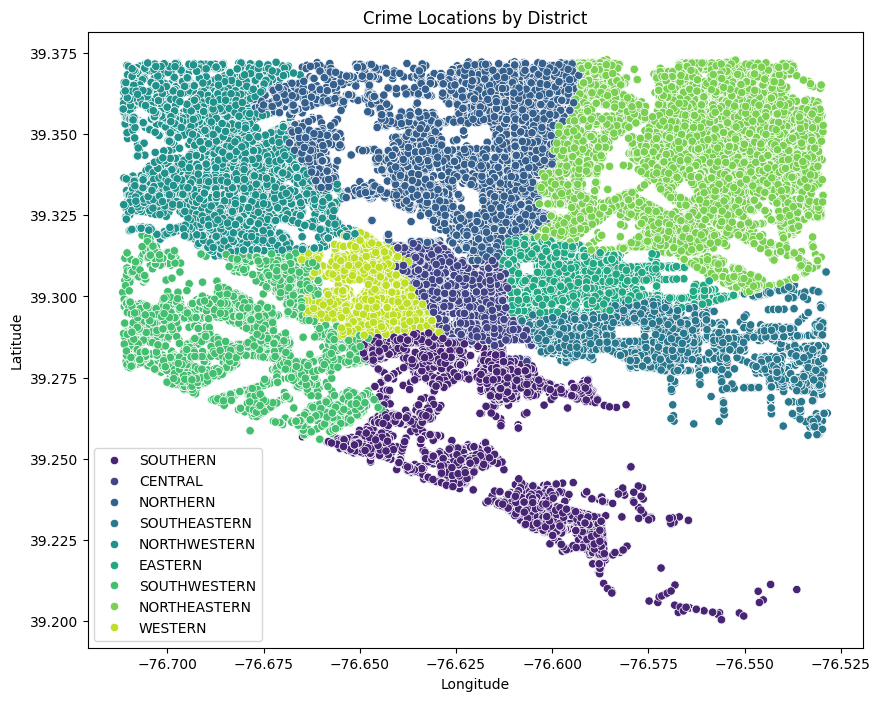

In [29]:

plt.figure(figsize=(10, 8))
sns.scatterplot(x='Longitude', y='Latitude', data=df, hue='District', palette='viridis')
plt.title('Crime Locations by District')
plt.legend()  
plt.show()

## Data Visualization

## Time and Crime Analysis

In [30]:
morning_crimes = df[(df['Hour'] >= 6) & (df['Hour'] < 12)]

morning_crimes

,CrimeCode,Location,Description,Inside/Outside,Weapon,Post,District,Neighborhood,Longitude,Latitude,Location 1,Premise,Day,Month,Year,Weekday,Hour
Date,,,,,,,,,,,,,,,,,
2017-09-02 11:55:00,4E,2900 KEYWORTH AVE,COMMON ASSAULT,Inside,HANDS,613.0,NORTHWESTERN,Towanda-Grantley,-76.66433,39.33209,"(39.3320900000, -76.6643300000)",ROW/TOWNHO,2,9,2017,6,11
2017-09-02 11:25:00,6D,2900 HAMILTON AVE,LARCENY FROM AUTO,Outside,NO WEAPON,423.0,NORTHEASTERN,Hamilton Hills,-76.56260,39.35313,"(39.3531300000, -76.5626000000)",PARKING LO,2,9,2017,6,11
2017-09-02 11:18:00,3K,0 BENKERT AVE,ROBBERY - RESIDENCE,Inside,NO WEAPON,842.0,SOUTHWESTERN,Saint Josephs,-76.67387,39.28575,"(39.2857500000, -76.6738700000)",ROW/TOWNHO,2,9,2017,6,11
2017-09-02 09:35:00,6J,2500 PENNSYLVANIA AVE,LARCENY,Outside,NO WEAPON,733.0,WESTERN,Penn North,-76.64277,39.31033,"(39.3103300000, -76.6427700000)",STREET,2,9,2017,6,9
2017-09-02 09:00:00,6G,2000 LINDEN AVE,LARCENY,Inside,NO WEAPON,133.0,CENTRAL,Reservoir Hill,-76.63251,39.31059,"(39.3105900000, -76.6325100000)",LAUNDRY/CL,2,9,2017,6,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2012-01-01 07:33:00,4D,500 S BROADWAY,AGG. ASSAULT,Outside,HANDS,213.0,SOUTHEASTERN,Fells Point,-76.59360,39.28542,"(39.2854200000, -76.5936000000)",STREET,1,1,2012,7,7
2012-01-01 07:04:00,7A,200 E LOMBARD ST,AUTO THEFT,Inside,NO WEAPON,111.0,CENTRAL,Downtown,-76.61165,39.28784,"(39.2878400000, -76.6116500000)",PARKING LO,1,1,2012,7,7
2012-01-01 07:00:00,7A,5300 BELLEVILLE AV,AUTO THEFT,Outside,NO WEAPON,622.0,NORTHWESTERN,Howard Park,-76.70403,39.33269,"(39.3326900000, -76.7040300000)",STREET,1,1,2012,7,7


In [31]:
monthly_crimes = df.resample('ME').size()
monthly_crimes

Date
2012-01-31    3824
2012-02-29    3333
2012-03-31    4256
2012-04-30    3941
2012-05-31    4608
              ... 
2017-05-31    4456
2017-06-30    4526
2017-07-31    4474
2017-08-31    4326
2017-09-30     162
Freq: ME, Length: 69, dtype: int64

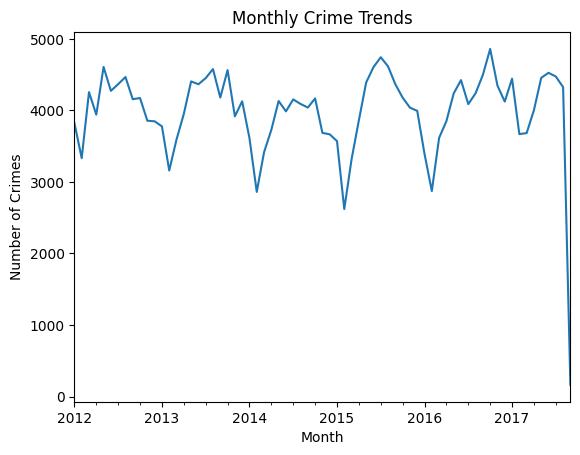

In [32]:

monthly_crimes.plot(kind='line')
plt.title('Monthly Crime Trends')
plt.xlabel('Month')
plt.ylabel('Number of Crimes')
plt.show()


In [33]:
weekend_crimes = df[df['Day'].isin([5, 6])]

In [34]:
weekend_crimes

,CrimeCode,Location,Description,Inside/Outside,Weapon,Post,District,Neighborhood,Longitude,Latitude,Location 1,Premise,Day,Month,Year,Weekday,Hour
Date,,,,,,,,,,,,,,,,,
2017-08-06 23:59:00,4D,3900 BENZINGER RD,AGG. ASSAULT,Inside,HANDS,832.0,SOUTHWESTERN,Oaklee,-76.68601,39.26760,"(39.2676000000, -76.6860100000)",ROW/TOWNHO,6,8,2017,7,23
2017-08-06 23:59:00,4E,3900 BENZINGER RD,COMMON ASSAULT,Inside,HANDS,832.0,SOUTHWESTERN,Oaklee,-76.68601,39.26760,"(39.2676000000, -76.6860100000)",ROW/TOWNHO,6,8,2017,7,23
2017-08-06 23:50:00,3AF,5000 E BIDDLE ST,ROBBERY - STREET,Inside,FIREARM,433.0,NORTHEASTERN,Armistead Gardens,-76.55565,39.30605,"(39.3060500000, -76.5556500000)",STREET,6,8,2017,7,23
2017-08-06 23:47:00,5C,2400 E BALTIMORE ST,BURGLARY,Inside,NO WEAPON,221.0,SOUTHEASTERN,Patterson Place,-76.58295,39.29199,"(39.2919900000, -76.5829500000)",ROW/TOWNHO,6,8,2017,7,23
2017-08-06 23:39:00,4B,1100 COMET ST,AGG. ASSAULT,Inside,KNIFE,211.0,SOUTHEASTERN,Pleasant View Gardens,-76.60235,39.29281,"(39.2928100000, -76.6023500000)",HOSP/NURS.,6,8,2017,7,23
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2012-01-05 00:41:00,4B,800 W LOMBARD ST,AGG. ASSAULT,Inside,KNIFE,931.0,SOUTHERN,Hollins Market,-76.62841,39.28707,"(39.2870700000, -76.6284100000)",APT/CONDO,5,1,2012,4,0
2012-01-05 00:35:00,3AK,1200 E MADISON ST,ROBBERY - STREET,Outside,KNIFE,312.0,EASTERN,Oldtown,-76.60167,39.29917,"(39.2991700000, -76.6016700000)",STREET,5,1,2012,4,0
2012-01-05 00:01:00,6E,2600 E MADISON ST,LARCENY,Outside,NO WEAPON,323.0,EASTERN,Madison-Eastend,-76.57998,39.30002,"(39.3000200000, -76.5799800000)",STREET,5,1,2012,4,0


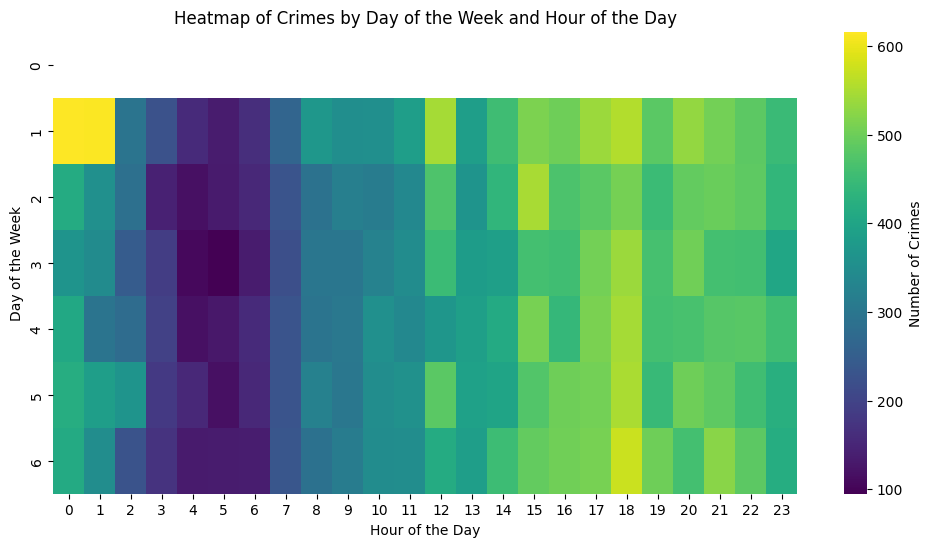

In [35]:

heatmap_data = df.groupby(['Day', 'Hour']).size().unstack().reindex([0,1,2,3,4,5,6])

# Plot heatmap
plt.figure(figsize=(12, 6))
sns.heatmap(heatmap_data, cmap='viridis', cbar_kws={'label': 'Number of Crimes'})
plt.title('Heatmap of Crimes by Day of the Week and Hour of the Day')
plt.xlabel('Hour of the Day')
plt.ylabel('Day of the Week')
plt.show()

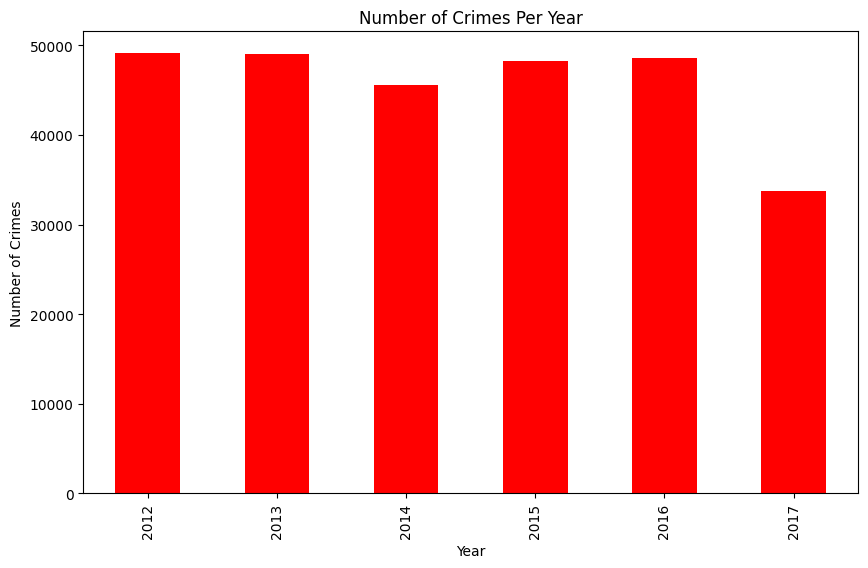

In [36]:
crimes_per_year = df['Year'].value_counts().sort_index()

# Plot the bar chart
plt.figure(figsize=(10, 6))
crimes_per_year.plot(kind='bar', color='red')
plt.title('Number of Crimes Per Year')
plt.xlabel('Year')
plt.ylabel('Number of Crimes')
plt.show()

In [30]:
df.head()

,CrimeCode,Location,Description,Inside/Outside,Weapon,Post,District,Neighborhood,Longitude,Latitude,Location 1,Premise,Day,Month,Year,Weekday,Hour
Date,,,,,,,,,,,,,,,,,
2017-09-02 23:30:00,3JK,4200 AUDREY AVE,ROBBERY - RESIDENCE,Inside,KNIFE,913.0,SOUTHERN,Brooklyn,-76.60541,39.22951,"(39.2295100000, -76.6054100000)",ROW/TOWNHO,2,9,2017,6,23
2017-09-02 23:00:00,7A,800 NEWINGTON AVE,AUTO THEFT,Outside,NO WEAPON,133.0,CENTRAL,Reservoir Hill,-76.63217,39.31360,"(39.3136000000, -76.6321700000)",STREET,2,9,2017,6,23
2017-09-02 22:53:00,9S,600 RADNOR AV,SHOOTING,Outside,FIREARM,524.0,NORTHERN,Winston-Govans,-76.60697,39.34768,"(39.3476800000, -76.6069700000)",Street,2,9,2017,6,22
2017-09-02 22:50:00,4C,1800 RAMSAY ST,AGG. ASSAULT,Inside,OTHER,934.0,SOUTHERN,Carrollton Ridge,-76.64526,39.28315,"(39.2831500000, -76.6452600000)",ROW/TOWNHO,2,9,2017,6,22
2017-09-02 22:31:00,4E,100 LIGHT ST,COMMON ASSAULT,Outside,HANDS,113.0,CENTRAL,Downtown West,-76.61365,39.28756,"(39.2875600000, -76.6136500000)",STREET,2,9,2017,6,22


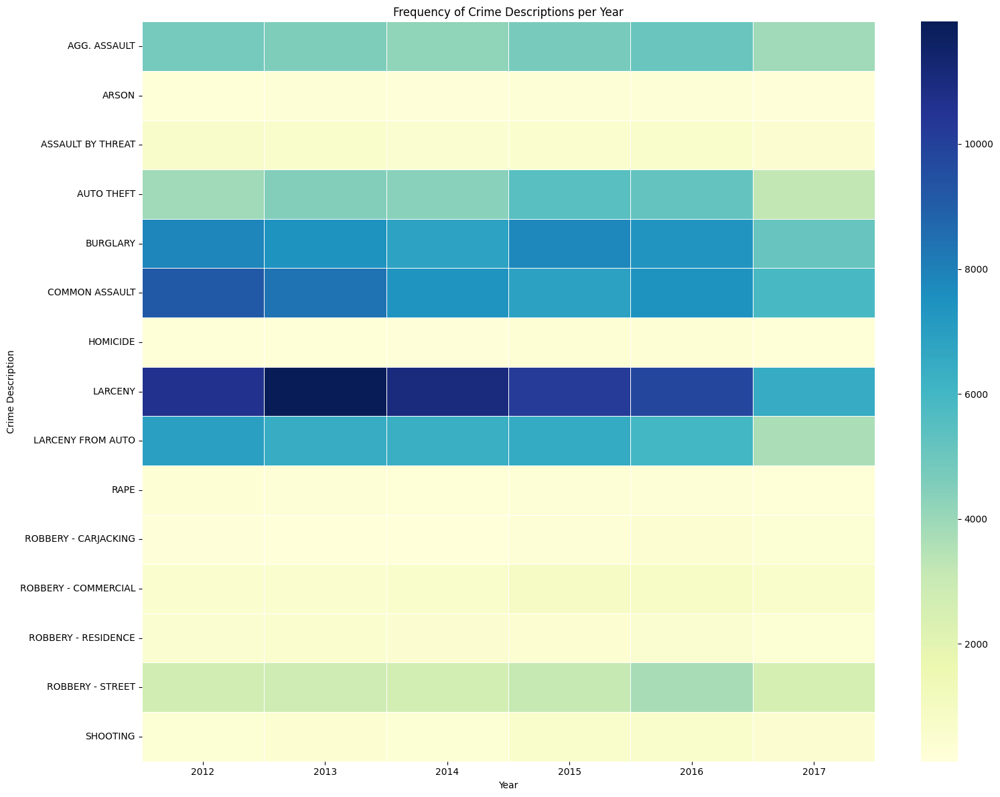

In [37]:
pivot_table = df.pivot_table(index='Description', columns='Year', aggfunc='size', fill_value=0)

# Plot the heatmap
plt.figure(figsize=(16, 12))
sns.heatmap(pivot_table, cmap='YlGnBu', linewidths=.5)

# Set titles and labels
plt.title('Frequency of Crime Descriptions per Year')
plt.xlabel('Year')
plt.ylabel('Crime Description')

# Adjust layout for better fit
plt.tight_layout()

# Show the plot
plt.show()

[]

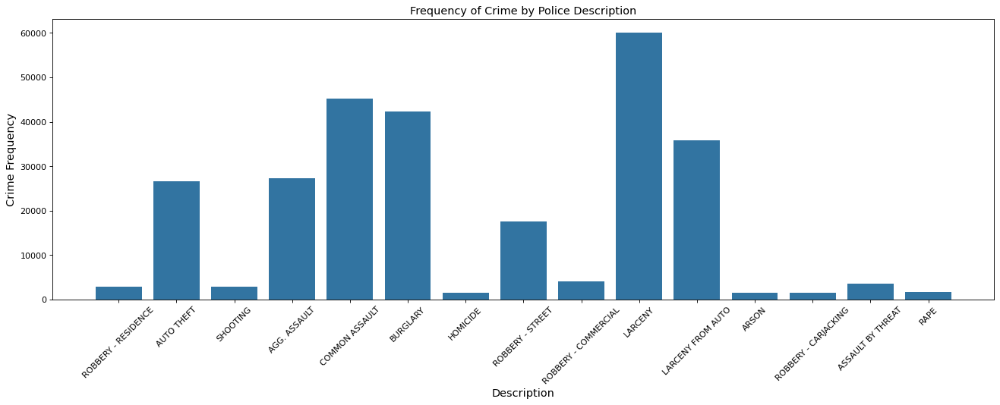

In [38]:
plt.figure(figsize=(20,6), dpi=80)

plt.title('Frequency of Crime by Police Description', fontsize=13)
ax = sns.countplot(x = 'Description', data = df)
plt.ylabel("Crime Frequency", fontsize=13)
plt.xlabel('Description', fontsize=13)
plt.xticks(rotation = 45)
plt.plot()


[]

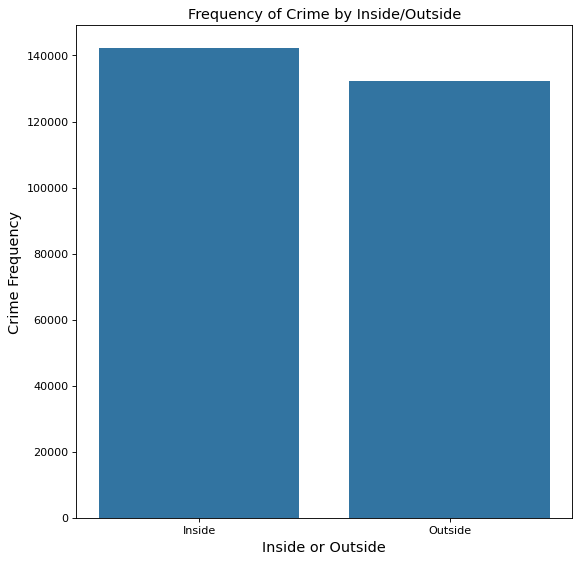

In [39]:
plt.figure(figsize=(8,8), dpi=80)

plt.title('Frequency of Crime by Inside/Outside', fontsize=13)
ax = sns.countplot(x = 'Inside/Outside', data = df)
plt.ylabel("Crime Frequency", fontsize=13)
plt.xlabel('Inside or Outside', fontsize=13)
plt.plot()

[]

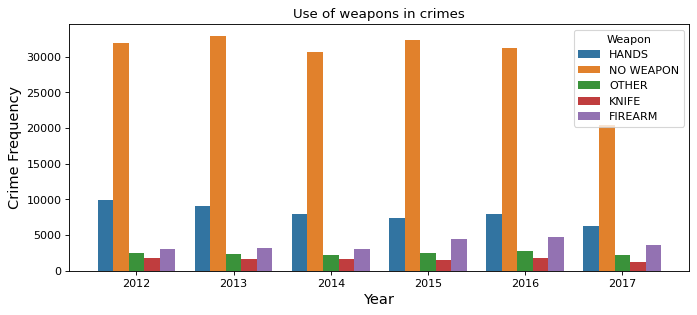

In [41]:
plt.figure(figsize = (10, 4), dpi = 80)

ax = sns.countplot(x = "Year", hue = "Weapon", data = df)
plt.ylabel("Frequency of Crime per Year Grouped by Weapon Used", fontsize = 13)
plt.ylabel("Crime Frequency", fontsize = 13)
plt.xlabel("Year", fontsize = 13)
plt.title("Use of weapons in crimes")
plt.plot()


## Geographical Crime Analysis

[]

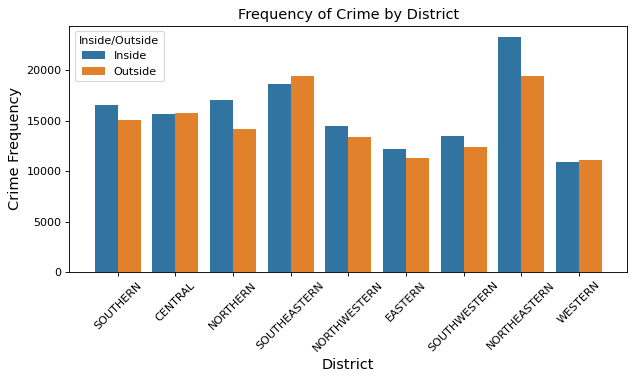

In [42]:
plt.figure(figsize=(9,4), dpi=80)

plt.title('Frequency of Crime by District', fontsize=13)
ax = sns.countplot(x = 'District', hue = 'Inside/Outside', data = df)
plt.ylabel("Crime Frequency", fontsize=13)
plt.xlabel('District', fontsize=13)
plt.xticks(rotation = 45)
plt.plot()

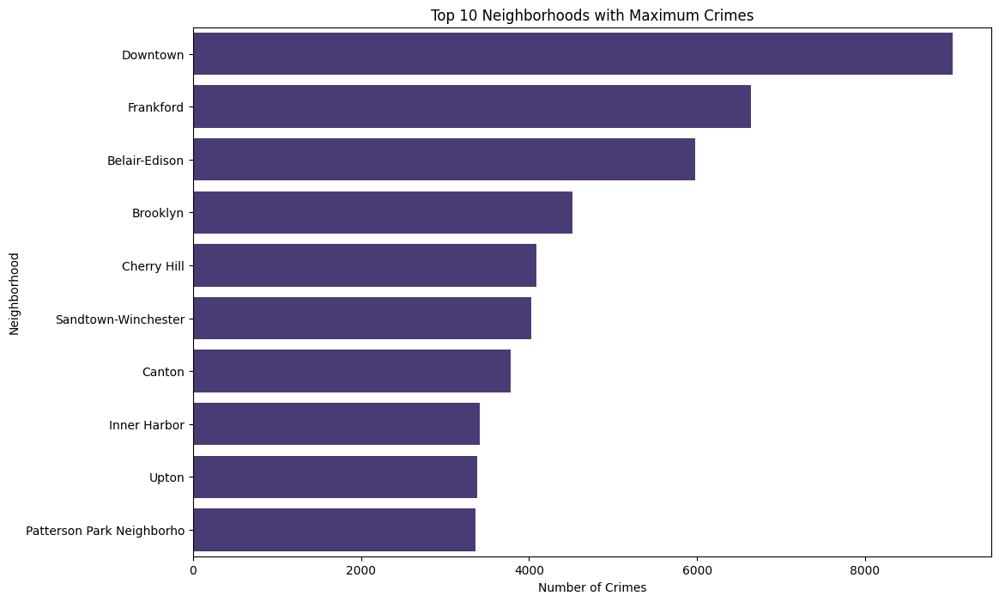

In [43]:
neighborhood_counts = df['Neighborhood'].value_counts().head(10)

# Convert the Series to a DataFrame for Seaborn
neighborhood_counts_df = neighborhood_counts.reset_index()
neighborhood_counts_df.columns = ['Neighborhood', 'Count']

# Set the color palette
sns.set_palette('viridis')

# Plot the bar chart using Seaborn
plt.figure(figsize=(12, 8))
sns.barplot(x='Count', y='Neighborhood', data=neighborhood_counts_df)
plt.title('Top 10 Neighborhoods with Maximum Crimes')
plt.xlabel('Number of Crimes')
plt.ylabel('Neighborhood')

# Show the plot
plt.show()

Text(0, 0.5, 'Premise')

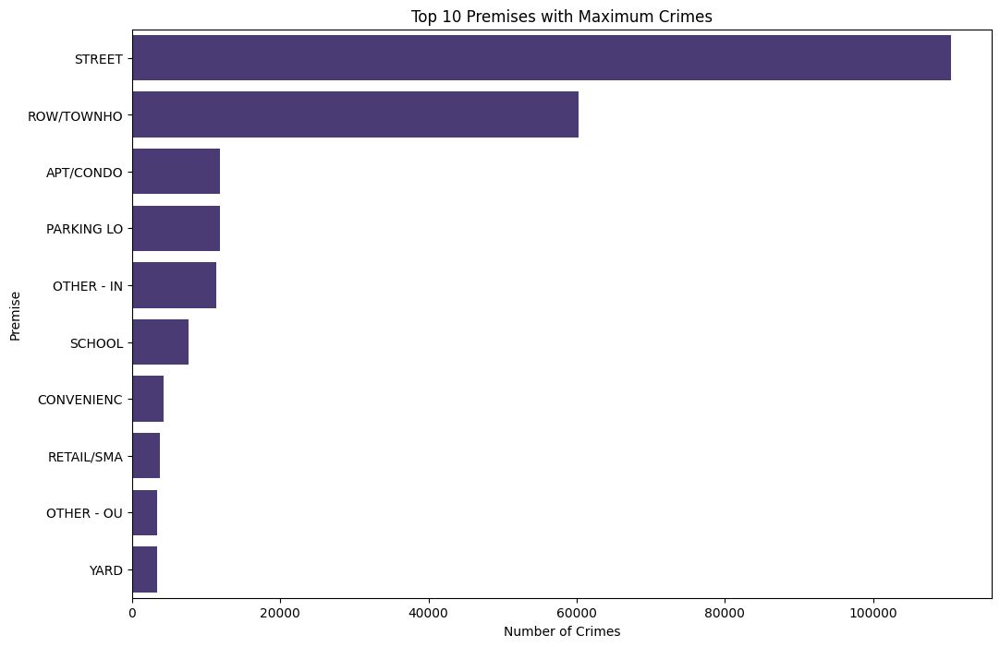

In [44]:
premise_counts = df['Premise'].value_counts().head(10)  # Top 10 premises

# Convert the Series to a DataFrame for Seaborn
premise_counts_df = premise_counts.reset_index()
premise_counts_df.columns = ['Premise', 'Count']

# Plot the bar chart using Seaborn
plt.figure(figsize=(12, 8))
sns.barplot(x='Count', y='Premise', data=premise_counts_df)
plt.title('Top 10 Premises with Maximum Crimes')
plt.xlabel('Number of Crimes')
plt.ylabel('Premise')

In [45]:


# Create a base map centered at Baltimore, Maryland
crime_map = folium.Map(location=[39.29, -76.61], zoom_start=10)

# Add a heatmap layer to the map
heat_data = [[row['Latitude'], row['Longitude']] for index, row in df.iterrows()]
HeatMap(heat_data).add_to(crime_map)
HeatMap(heat_data, radius=15, blur=20, gradient={0.4: 'blue', 0.65: 'lime', 1: 'red'}).add_to(crime_map)

# Display the map
crime_map


In [46]:

geofence = {
    'min_lat': 39.25,
    'max_lat': 39.35,
    'min_lon': -76.65,
    'max_lon': -76.55
}

# Function to check if a point (latitude, longitude) falls within the geofence
def is_inside_geofence(lat, lon):
    return geofence['min_lat'] <= lat <= geofence['max_lat'] and geofence['min_lon'] <= lon <= geofence['max_lon']

# Apply the function to the DataFrame to create a new column indicating if the crime incident is inside the geofence
df['Inside Geofence'] = df.apply(lambda row: is_inside_geofence(row['Latitude'], row['Longitude']), axis=1)

# Print the count of crime incidents inside the geofence
print("Number of crime incidents inside the geofence:", df['Inside Geofence'].sum())


Number of crime incidents inside the geofence: 166382


## Converting Categorical Data to Numerical Data


In [47]:
df['Inside Geofence'] = df['Inside Geofence'].astype(int)
label_encoder = LabelEncoder()
df['District'] = label_encoder.fit_transform(df['District'])


In [48]:
label_encoder = LabelEncoder()
df['Inside/Outside'] = label_encoder.fit_transform(df['Inside/Outside'])
label_encoder = LabelEncoder()
df['CrimeCode'] = label_encoder.fit_transform(df['CrimeCode'])
label_encoder = LabelEncoder()
df['Weapon'] = label_encoder.fit_transform(df['Weapon'])


In [50]:
X = df[['Longitude', 'Latitude','CrimeCode','District','Hour']]
y = df['Weapon'] 

In [51]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Normalize the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)



In [52]:
# Train a Decision Tree model
model = DecisionTreeClassifier(random_state=42)
model.fit(X_train_scaled, y_train)



DecisionTreeClassifier(random_state=42)

In [53]:
# Make predictions
y_pred_train = model.predict(X_train_scaled)
y_pred_test = model.predict(X_test_scaled)



In [54]:
# Calculate accuracy
train_accuracy = accuracy_score(y_train, y_pred_train)
test_accuracy = accuracy_score(y_test, y_pred_test)


print("Training Accuracy:", train_accuracy)
print("Testing Accuracy:", test_accuracy)


Training Accuracy: 1.0
Testing Accuracy: 1.0


In [55]:
X = df[[ 'Hour', 'Longitude', 'Latitude','District','CrimeCode']]
y = df['Weapon']

In [56]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Normalize the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [57]:
model = RandomForestClassifier(n_estimators = 100,random_state=42)
model.fit(X_train_scaled, y_train)


RandomForestClassifier(random_state=42)

In [58]:
y_pred_train = model.predict(X_train_scaled)
y_pred_test = model.predict(X_test_scaled)


In [59]:
# Calculate accuracy
train_accuracy = accuracy_score(y_train, y_pred_train)
test_accuracy = accuracy_score(y_test, y_pred_test)


print("Training Accuracy:", train_accuracy)
print("Testing Accuracy:", test_accuracy)


Training Accuracy: 1.0
Testing Accuracy: 0.9938939924176144
